This notebook is a modified version of one provided in the [GitHub Repository](https://github.com/JiamingZhuge/FRB_ML_unsp/tree/main) of Zhu-Ge et al. 2023 - [Machine learning classification of CHIME fast radio bursts: II. Unsupervised Methods](https://arxiv.org/abs/2210.02471).

Minor changes have been made to the physical feature calculations to allow it to work.

### Loading data


In [1]:
# This is an addition from the previous author's version of this notebook, to account for multiple catalog options. We run this notebook once for each option.
CATALOGS = [
    "chime_frb_catalog_2021",
]
SELECTED_CATALOG = CATALOGS[0]

In [2]:
import pandas as pd

df = pd.read_csv(f"./data/raw_data/{SELECTED_CATALOG}.csv")
pd.set_option("display.max_columns", None)

df["previous_rp_name"] = df["repeater_name"]
df["is_repeater"] = df["repeater_name"] != "-9999"
df["is_repeater"] = df["is_repeater"].astype(int)

df["scat_time"] = df["scat_time"].str.replace(r"<", "")
df["scat_time"] = df["scat_time"].astype(float)

try:
    df["width_fitb"] = df["width_fitb"].str.replace(r"<", "")
    df["width_fitb"] = df["width_fitb"].astype(float)
except Exception as e:
    print(e)

df.drop(
    errors="ignore",
    columns=[
        "ra_notes",
        "dec_notes",
        "exp_up_notes",
        "exp_low_notes",
        "flux_notes",
        "fluence_notes",
        "ra_err",
        "dec_err",
        "exp_up_err",
        "exp_low_err",
        "dm_fitb_err",
        "scat_time_err",
        "flux_err",
        "fluence_err",
        "mjd_400",
        "mjd_400_err",
        "mjd_inf",
        "mjd_inf_err",
        "width_fitb_err",
        "sp_idx_err",
        "sp_run_err",
        "ra_1_err_low",
        "ra_1_err_up",
        "ra_2_err_low",
        "ra_2_err_up",
        "dec_1_err_up",
        "dec_1_err_low",
        "dec_2_err_low",
        "dec_2_err_up",
        "low_ft_68",
        "up_ft_68",
        "low_ft_90",
        "up_ft_90",
        "low_ft_95",
        "up_ft_95",
    ],
    inplace=True,
)

print(len(df.columns))
df

32


,tns_name,previous_name,repeater_name,ra,dec,gl,gb,exp_up,exp_low,bonsai_snr,bonsai_dm,snr_fitb,dm_fitb,dm_exc_ne2001,dm_exc_ymw16,bc_width,scat_time,flux,fluence,sub_num,width_fitb,sp_idx,sp_run,high_freq,low_freq,peak_freq,chi_sq,dof,flag_frac,excluded_flag,previous_rp_name,is_repeater
0,FRB20180725A,180725.J0613+67,-9999,93.42,67.07,147.29,21.29,30.0,-9999.0,19.2,716.6,33.2,715.80930,644.2,635.4,0.00295,0.001100,1.70,4.10,0,0.000296,38.20,-45.80,760.1,485.3,607.4,371857.954,371481,0.403,1,-9999,0
1,FRB20180727A,180727.J1311+26,-9999,197.72,26.42,24.76,85.60,10.4,-9999.0,10.4,642.1,12.2,642.13400,620.9,622.4,0.00295,0.001700,0.58,2.31,0,0.001390,3.80,-9.20,800.2,400.2,493.3,382969.318,381818,0.387,1,-9999,0
2,FRB20180729A,180729.J1316+55,-9999,199.40,55.58,115.26,61.16,21.0,-9999.0,32.0,108.4,206.6,109.59418,78.8,86.8,0.00098,0.000157,11.70,17.00,0,0.000100,16.46,-30.21,692.7,400.2,525.6,264732.041,186953,0.399,1,-9999,0
3,FRB20180729B,180729.J0558+56,-9999,89.93,56.50,156.90,15.68,21.0,-9999.0,12.4,318.6,22.0,317.22350,223.2,198.8,0.00197,0.000660,0.92,1.20,0,0.000314,14.50,-14.60,800.2,441.8,657.5,425139.488,421337,0.323,1,-9999,0
4,FRB20180730A,180730.J0353+87,-9999,57.39,87.19,125.11,25.11,270.0,214.0,69.5,849.2,89.8,848.90410,789.7,790.5,0.00492,0.002073,5.20,27.00,0,0.000468,4.27,-11.31,759.2,400.2,483.5,429165.844,417689,0.329,1,-9999,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
595,FRB20190701A,-9999,-9999,277.47,59.04,88.29,25.72,23.0,-9999.0,12.1,635.7,14.6,637.09340,582.8,587.8,0.00197,0.000720,1.26,1.70,0,0.000608,-1.10,3.30,800.2,400.2,800.2,341779.300,341690,0.451,0,-9999,0
596,FRB20190701B,-9999,-9999,302.93,80.18,112.88,23.40,69.0,70.0,15.0,748.9,17.5,749.11400,687.6,688.1,0.00295,0.000340,1.10,1.90,0,0.000630,3.90,-11.80,732.8,400.2,471.5,329229.311,330137,0.470,0,-9999,0
597,FRB20190701C,-9999,-9999,96.36,81.63,132.18,25.88,82.0,82.0,11.5,972.1,16.8,974.19500,915.8,916.6,0.00197,0.001800,0.88,2.50,0,0.001440,46.20,-211.00,495.5,402.2,446.4,285697.192,286362,0.540,0,-9999,0
598,FRB20190701D,-9999,-9999,112.10,66.70,149.28,28.38,34.0,-9999.0,34.4,934.9,44.8,933.36290,877.4,879.4,0.00885,0.001530,1.33,8.60,0,0.001400,6.49,-20.90,651.8,400.2,467.6,358566.724,354457,0.431,0,-9999,0


Note that all rows in the 2023 catalog are repeaters


In [3]:
# Preprocessing for the 2023 catalog
if SELECTED_CATALOG == CATALOGS[2]:
    # Replace values with -9999 in dm_exc columns with 0 to make sure averages are not affected
    df["dm_exc_1_ne2001"] = df["dm_exc_1_ne2001"].replace(-9999, 0)
    df["dm_exc_2_ne2001"] = df["dm_exc_2_ne2001"].replace(-9999, 0)
    df["dm_exc_1_ymw16"] = df["dm_exc_1_ymw16"].replace(-9999, 0)
    df["dm_exc_2_ymw16"] = df["dm_exc_2_ymw16"].replace(-9999, 0)

    df["dm_exc_ne2001"] = df[["dm_exc_1_ne2001", "dm_exc_2_ne2001"]].mean(axis=1)
    df.drop(columns=["dm_exc_1_ne2001", "dm_exc_2_ne2001"], inplace=True)

    df["dm_exc_ymw16"] = df[["dm_exc_1_ymw16", "dm_exc_2_ymw16"]].mean(axis=1)
    df.drop(columns=["dm_exc_1_ymw16", "dm_exc_2_ymw16"], inplace=True)

    df["ra"] = df[["ra_1", "ra_2"]].mean(axis=1)
    df.drop(columns=["ra_1", "ra_2"], inplace=True)

    df["dec"] = df[["dec_1", "dec_2"]].mean(axis=1)
    df.drop(columns=["dec_1", "dec_2"], inplace=True)

    df.drop(columns=["R_cc"], inplace=True)

### Redshifts


$\Omega_b(baryon),\Omega_{c}(cold\;dark\;matter),\Omega_r(radiation\;energy)$


In [4]:
import astropy.units as units
import numpy as np

# Parameters
H = 67.4  # 67.3 #km/s/Mpc
h = H / 100
h2 = h * h
O_b = 0.0224 / h2  # 0.0486
O_m = 0.315  # matter
O_k = 0
O_L = 1 - O_m - O_k  # dark energy

c = 299792458  # m/s
pc_m = 3.085677581491367e16
cm = 100
km = 1000
M = 1e6
m_p = 1.67262192e-27  # kg
G = 6.67430e-11  # m^3/kg/s^2

$ \Omega_b\frac{3H_0 c}{8\pi G m_p}\frac{7}{8} $


In [5]:
alpha = (
    3 * 7 * H * c * O_b / 8 / 8 / np.pi / G / m_p * km / M / pc_m / cm / cm / cm / pc_m
)

In [6]:
from scipy import integrate


def f_IGM(z):
    return 0.83  # (z>1.5)*0.9+(z<=1.5)*(0.053*z+0.82)


def I_IGM(z, m=O_m, la=O_L):
    return (1.0 + z) * f_IGM(z) / np.sqrt(m * (1.0 + z) ** 3 + la)


def f_DM(z, a=alpha):
    Int = integrate.quad(I_IGM, 0, z)[0]
    return 30.0 + a * Int + 70.0 / (1.0 + z)

$DM-DM_{MW}=30+DM_{IGM}+\frac{70}{1+z}$


In [7]:
from scipy.optimize import fsolve


def f_z(DM_MW, n=8):
    return fsolve(lambda z: f_DM(z) - DM_MW, 0)[0]

In [8]:
z_min = H * 10 / c * 1000

DM_MWs = df["dm_exc_ne2001"].values
redshift = np.zeros(len(DM_MWs))
for i, DM_MW in enumerate(DM_MWs):
    redshift[i] = f_z(DM_MW)
    if redshift[i] <= z_min:
        # print(i)
        redshift[i] = z_min
df["redshift"] = redshift

In [9]:
known_redshifts = {
    "FRB20121102A": 0.19273,
    "FRB20171020A": 0.0087,
    "FRB20180301A": 0.3304,
    "FRB20180916B": 0.0337,
    "FRB20180924C": 0.3214,
    "FRB20181112A": 0.4755,
    "FRB20190102C": 0.291,
    "FRB20190520B": 0.241,
    "FRB20190523A": 0.66,
    "FRB20190608B": 0.1178,
    "FRB20190611B": 0.378,
    "FRB20190711A": 0.522,
    "FRB20190714A": 0.2365,
    "FRB20191001A": 0.234,
    "FRB20191228A": 0.2432,
    "FRB20200120E": 0.0008,
    "FRB20200430A": 0.1608,
    "FRB20200906A": 0.3688,
    "FRB20201124A": 0.098,
}

# Replace redshifts with known values
for i in range(df.shape[0]):
    if df.loc[i, "tns_name"] in known_redshifts.keys():
        df.loc[i, "redshift"] = known_redshifts[df.loc[i, "tns_name"]]

### Rest-frame frequency width


In [10]:
df["fre_width"] = (df["high_freq"] - df["low_freq"]) * (1 + df["redshift"])
df["fre_width_ob"] = df["high_freq"] - df["low_freq"]

### Rest-frame width (ms)


$\frac{Width\,of\,sub-burst\,using\,fitburst}{1+z}$


In [11]:
# in_duration=df['bc_width'].values/(1+redshift)
in_duration = 1000 * df["width_fitb"].values / (1 + redshift)
df["in_duration"] = in_duration
# from s to ms
# df.loc[:,'bc_width']=df['bc_width'].values*1000

# Energy


$d_L=(1+z)\frac{c}{H_0}\int_0^z\frac{dz'}{E(z')}$

$E(z)=\sqrt{\Omega_r(1+z)^4+\Omega_m(1+z)^3+\Omega_k(1+z)^2+\Omega_\Lambda}$


astropy.cosmos distance


In [12]:
from astropy.cosmology import FlatLambdaCDM

cosmo = FlatLambdaCDM(
    H0=H * units.km / units.s / units.Mpc, Om0=O_m
)  # ,Tcmb0=2.7255*units.K)
d_L_cos = cosmo.luminosity_distance(df["redshift"])  # MPc

$E=\frac{4\pi d_L^2}{1+z}F_\nu \nu_c$


In [13]:
for i, row in df.iterrows():
    redshift = row["redshift"]  # no units
    luminosity_distance = cosmo.luminosity_distance(redshift)  # Mpc

    fluence = row["fluence"] * units.Jy * units.ms  # Jy ms as per the catalog
    peak_freq = row["peak_freq"] * units.MHz  # MHz as per the catalog

    energy = ((4 * np.pi * (luminosity_distance**2)) / (1 + redshift)) * (
        fluence * peak_freq
    )
    energy_erg = energy.to(units.erg)

    df.loc[i, "energy"] = energy_erg.value
df

,tns_name,previous_name,repeater_name,ra,dec,gl,gb,exp_up,exp_low,bonsai_snr,bonsai_dm,snr_fitb,dm_fitb,dm_exc_ne2001,dm_exc_ymw16,bc_width,scat_time,flux,fluence,sub_num,width_fitb,sp_idx,sp_run,high_freq,low_freq,peak_freq,chi_sq,dof,flag_frac,excluded_flag,previous_rp_name,is_repeater,redshift,fre_width,fre_width_ob,in_duration,energy
0,FRB20180725A,180725.J0613+67,-9999,93.42,67.07,147.29,21.29,30.0,-9999.0,19.2,716.6,33.2,715.80930,644.2,635.4,0.00295,0.001100,1.70,4.10,0,0.000296,38.20,-45.80,760.1,485.3,607.4,371857.954,371481,0.403,1,-9999,0,0.640740,450.875425,274.8,0.180406,2.827944e+40
1,FRB20180727A,180727.J1311+26,-9999,197.72,26.42,24.76,85.60,10.4,-9999.0,10.4,642.1,12.2,642.13400,620.9,622.4,0.00295,0.001700,0.58,2.31,0,0.001390,3.80,-9.20,800.2,400.2,493.3,382969.318,381818,0.387,1,-9999,0,0.614818,645.927163,400.0,0.860778,1.189571e+40
2,FRB20180729A,180729.J1316+55,-9999,199.40,55.58,115.26,61.16,21.0,-9999.0,32.0,108.4,206.6,109.59418,78.8,86.8,0.00098,0.000157,11.70,17.00,0,0.000100,16.46,-30.21,692.7,400.2,525.6,264732.041,186953,0.399,1,-9999,0,0.002248,293.157605,292.5,0.099776,1.070358e+36
3,FRB20180729B,180729.J0558+56,-9999,89.93,56.50,156.90,15.68,21.0,-9999.0,12.4,318.6,22.0,317.22350,223.2,198.8,0.00197,0.000660,0.92,1.20,0,0.000314,14.50,-14.60,800.2,441.8,657.5,425139.488,421337,0.323,1,-9999,0,0.157566,414.871625,358.4,0.271259,4.966122e+38
4,FRB20180730A,180730.J0353+87,-9999,57.39,87.19,125.11,25.11,270.0,214.0,69.5,849.2,89.8,848.90410,789.7,790.5,0.00492,0.002073,5.20,27.00,0,0.000468,4.27,-11.31,759.2,400.2,483.5,429165.844,417689,0.329,1,-9999,0,0.802405,647.063272,359.0,0.259653,2.335510e+41
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
595,FRB20190701A,-9999,-9999,277.47,59.04,88.29,25.72,23.0,-9999.0,12.1,635.7,14.6,637.09340,582.8,587.8,0.00197,0.000720,1.26,1.70,0,0.000608,-1.10,3.30,800.2,400.2,800.2,341779.300,341690,0.451,0,-9999,0,0.572362,628.944866,400.0,0.386679,1.226913e+40
596,FRB20190701B,-9999,-9999,302.93,80.18,112.88,23.40,69.0,70.0,15.0,748.9,17.5,749.11400,687.6,688.1,0.00295,0.000340,1.10,1.90,0,0.000630,3.90,-11.80,732.8,400.2,471.5,329229.311,330137,0.470,0,-9999,0,0.688973,561.752466,332.6,0.373008,1.178856e+40
597,FRB20190701C,-9999,-9999,96.36,81.63,132.18,25.88,82.0,82.0,11.5,972.1,16.8,974.19500,915.8,916.6,0.00197,0.001800,0.88,2.50,0,0.001440,46.20,-211.00,495.5,402.2,446.4,285697.192,286362,0.540,0,-9999,0,0.943004,181.282298,93.3,0.741120,2.752633e+40
598,FRB20190701D,-9999,-9999,112.10,66.70,149.28,28.38,34.0,-9999.0,34.4,934.9,44.8,933.36290,877.4,879.4,0.00885,0.001530,1.33,8.60,0,0.001400,6.49,-20.90,651.8,400.2,467.6,358566.724,354457,0.431,0,-9999,0,0.900089,478.062518,251.6,0.736807,9.045763e+40


### Luminosity


$L=4\pi d_L^2S_{\nu,p}\nu_c$


In [14]:
"""
import astropy.units as u
d_L=d_L_cos
Lum=4*np.pi*d_L*d_L*df['flux']*units.Jy*df['peak_freq']*units.MHz
for j in range(len(Lum)):
    df.loc[j,'luminosity']=Lum[j].to(units.erg/units.s).value
df.head()
"""

"\nimport astropy.units as u\nd_L=d_L_cos\nLum=4*np.pi*d_L*d_L*df['flux']*units.Jy*df['peak_freq']*units.MHz\nfor j in range(len(Lum)):\n    df.loc[j,'luminosity']=Lum[j].to(units.erg/units.s).value\ndf.head()\n"

In [15]:
for i, row in df.iterrows():
    redshift = row["redshift"]  # no units
    luminosity_distance = cosmo.luminosity_distance(redshift)  # Mpc
    flux = row["flux"] * units.Jy  # Jy as per the catalog
    peak_freq = row["peak_freq"] * units.MHz  # MHz as per the catalog
    luminosity = 4 * np.pi * (luminosity_distance**2) * flux * peak_freq
    luminosity_erg = luminosity.to(units.erg / units.s)
    df.loc[i, "luminosity"] = luminosity_erg.value
df.head()
# We get the same results as the paper

,tns_name,previous_name,repeater_name,ra,dec,gl,gb,exp_up,exp_low,bonsai_snr,bonsai_dm,snr_fitb,dm_fitb,dm_exc_ne2001,dm_exc_ymw16,bc_width,scat_time,flux,fluence,sub_num,width_fitb,sp_idx,sp_run,high_freq,low_freq,peak_freq,chi_sq,dof,flag_frac,excluded_flag,previous_rp_name,is_repeater,redshift,fre_width,fre_width_ob,in_duration,energy,luminosity
0,FRB20180725A,180725.J0613+67,-9999,93.42,67.07,147.29,21.29,30.0,-9999.0,19.2,716.6,33.2,715.80930,644.2,635.4,0.00295,0.001100,1.70,4.10,0,0.000296,38.20,-45.80,760.1,485.3,607.4,371857.954,371481,0.403,1,-9999,0,0.640740,450.875425,274.8,0.180406,2.827944e+40,1.923870e+43
1,FRB20180727A,180727.J1311+26,-9999,197.72,26.42,24.76,85.60,10.4,-9999.0,10.4,642.1,12.2,642.13400,620.9,622.4,0.00295,0.001700,0.58,2.31,0,0.001390,3.80,-9.20,800.2,400.2,493.3,382969.318,381818,0.387,1,-9999,0,0.614818,645.927163,400.0,0.860778,1.189571e+40,4.823143e+42
2,FRB20180729A,180729.J1316+55,-9999,199.40,55.58,115.26,61.16,21.0,-9999.0,32.0,108.4,206.6,109.59418,78.8,86.8,0.00098,0.000157,11.70,17.00,0,0.000100,16.46,-30.21,692.7,400.2,525.6,264732.041,186953,0.399,1,-9999,0,0.002248,293.157605,292.5,0.099776,1.070358e+36,7.383140e+38
3,FRB20180729B,180729.J0558+56,-9999,89.93,56.50,156.90,15.68,21.0,-9999.0,12.4,318.6,22.0,317.22350,223.2,198.8,0.00197,0.000660,0.92,1.20,0,0.000314,14.50,-14.60,800.2,441.8,657.5,425139.488,421337,0.323,1,-9999,0,0.157566,414.871625,358.4,0.271259,4.966122e+38,4.407270e+41
4,FRB20180730A,180730.J0353+87,-9999,57.39,87.19,125.11,25.11,270.0,214.0,69.5,849.2,89.8,848.90410,789.7,790.5,0.00492,0.002073,5.20,27.00,0,0.000468,4.27,-11.31,759.2,400.2,483.5,429165.844,417689,0.329,1,-9999,0,0.802405,647.063272,359.0,0.259653,2.335510e+41,8.107252e+43


### Brightness Temperature


$T_b=\frac{S_{\nu,p}d_L^2}{2\pi k_B(\nu \Delta t)^2}/(1+z)$ , $d_A=\frac{d_L}{(1+z)^2}$ , $\Delta \Omega=\pi(c\Delta t)^2/d_A^2$


In [16]:
import astropy.constants as constants

for i, row in df.iterrows():
    redshift = row["redshift"]  # no units
    luminosity_distance = cosmo.luminosity_distance(redshift)  # Mpc
    flux = row["flux"] * units.Jy

    peak_freq = row["peak_freq"] * units.MHz
    dt = row["bc_width"] * units.s

    redshift = row["redshift"]

    brightness_temp = ((flux * (luminosity_distance**2)) / (1 + redshift)) / (
        2 * np.pi * constants.k_B * ((peak_freq * dt) ** 2)
    )
    brightness_temp_K = brightness_temp.to(units.K)
    df.loc[i, "T_B"] = brightness_temp_K.value

df.head()
# We get the same results as the paper

,tns_name,previous_name,repeater_name,ra,dec,gl,gb,exp_up,exp_low,bonsai_snr,bonsai_dm,snr_fitb,dm_fitb,dm_exc_ne2001,dm_exc_ymw16,bc_width,scat_time,flux,fluence,sub_num,width_fitb,sp_idx,sp_run,high_freq,low_freq,peak_freq,chi_sq,dof,flag_frac,excluded_flag,previous_rp_name,is_repeater,redshift,fre_width,fre_width_ob,in_duration,energy,luminosity,T_B
0,FRB20180725A,180725.J0613+67,-9999,93.42,67.07,147.29,21.29,30.0,-9999.0,19.2,716.6,33.2,715.80930,644.2,635.4,0.00295,0.001100,1.70,4.10,0,0.000296,38.20,-45.80,760.1,485.3,607.4,371857.954,371481,0.403,1,-9999,0,0.640740,450.875425,274.8,0.180406,2.827944e+40,1.923870e+43,5.515622e+35
1,FRB20180727A,180727.J1311+26,-9999,197.72,26.42,24.76,85.60,10.4,-9999.0,10.4,642.1,12.2,642.13400,620.9,622.4,0.00295,0.001700,0.58,2.31,0,0.001390,3.80,-9.20,800.2,400.2,493.3,382969.318,381818,0.387,1,-9999,0,0.614818,645.927163,400.0,0.860778,1.189571e+40,4.823143e+42,2.622746e+35
2,FRB20180729A,180729.J1316+55,-9999,199.40,55.58,115.26,61.16,21.0,-9999.0,32.0,108.4,206.6,109.59418,78.8,86.8,0.00098,0.000157,11.70,17.00,0,0.000100,16.46,-30.21,692.7,400.2,525.6,264732.041,186953,0.399,1,-9999,0,0.002248,293.157605,292.5,0.099776,1.070358e+36,7.383140e+38,4.845901e+32
3,FRB20180729B,180729.J0558+56,-9999,89.93,56.50,156.90,15.68,21.0,-9999.0,12.4,318.6,22.0,317.22350,223.2,198.8,0.00197,0.000660,0.92,1.20,0,0.000314,14.50,-14.60,800.2,441.8,657.5,425139.488,421337,0.323,1,-9999,0,0.157566,414.871625,358.4,0.271259,4.966122e+38,4.407270e+41,3.166148e+34
4,FRB20180730A,180730.J0353+87,-9999,57.39,87.19,125.11,25.11,270.0,214.0,69.5,849.2,89.8,848.90410,789.7,790.5,0.00492,0.002073,5.20,27.00,0,0.000468,4.27,-11.31,759.2,400.2,483.5,429165.844,417689,0.329,1,-9999,0,0.802405,647.063272,359.0,0.259653,2.335510e+41,8.107252e+43,1.508095e+36


In [17]:
print(
    len(df["tns_name"]),
    np.sum(df["repeater_name"] == "non-repeater"),
    np.sum(df["repeater_name"] == "repeater"),
)
df = df.drop(df[df.flux == 0].index)
df.reset_index(drop=True, inplace=True)
print(
    len(df["tns_name"]),
    np.sum(df["repeater_name"] == "non-repeater"),
    np.sum(df["repeater_name"] == "repeater"),
)

600 0 0
594 0 0


### log10 columns


In [18]:
features_to_log = [
    "dm_fitb",
    "bonsai_dm",
    "dm_exc_ne2001",
    "dm_exc_ymw16",
    "bc_width",
    "scat_time",
    "flux",
    "fluence",
    "width_fitb",
    "high_freq",
    "low_freq",
    "peak_freq",
    "fre_width",
    "redshift",
    "in_duration",
    "energy",
    "luminosity",
    "T_B",
]
log_cols = [f"log_{feature}" for feature in features_to_log]

log_df = pd.DataFrame()
for feature in features_to_log:
    column = f"log_{feature}"
    log_df[column] = np.log10(df[feature])
log_df.head()

,log_dm_fitb,log_bonsai_dm,log_dm_exc_ne2001,log_dm_exc_ymw16,log_bc_width,log_scat_time,log_flux,log_fluence,log_width_fitb,log_high_freq,log_low_freq,log_peak_freq,log_fre_width,log_redshift,log_in_duration,log_energy,log_luminosity,log_T_B
0,2.854797,2.855277,2.809021,2.803047,-2.530178,-2.958607,0.230449,0.612784,-3.528708,2.880871,2.686010,2.783475,2.654057,-0.193318,-0.743748,40.451471,43.284176,35.741595
1,2.807626,2.807603,2.793022,2.794070,-2.530178,-2.769551,-0.236572,0.363612,-2.856985,2.903199,2.602277,2.693111,2.810184,-0.211253,-0.065109,40.075391,42.683330,35.418756
2,2.039787,2.035029,1.896526,1.938520,-3.008774,-3.802995,1.068186,1.230449,-4.000000,2.840545,2.602277,2.720655,2.467101,-2.648161,-1.000975,36.029529,38.868241,32.685375
3,2.501365,2.503246,2.348694,2.298416,-2.705534,-3.180456,-0.036212,0.079181,-3.503070,2.903199,2.645226,2.817896,2.617914,-0.802538,-0.566616,38.696017,41.644170,34.500531
4,2.928859,2.929010,2.897462,2.897902,-2.308035,-2.683401,0.716003,1.431364,-3.329754,2.880356,2.602277,2.684396,2.810947,-0.095607,-0.585606,41.368382,43.908874,36.178429


In [19]:
df = pd.concat([df, log_df], axis=1)
df

,tns_name,previous_name,repeater_name,ra,dec,gl,gb,exp_up,exp_low,bonsai_snr,bonsai_dm,snr_fitb,dm_fitb,dm_exc_ne2001,dm_exc_ymw16,bc_width,scat_time,flux,fluence,sub_num,width_fitb,sp_idx,sp_run,high_freq,low_freq,peak_freq,chi_sq,dof,flag_frac,excluded_flag,previous_rp_name,is_repeater,redshift,fre_width,fre_width_ob,in_duration,energy,luminosity,T_B,log_dm_fitb,log_bonsai_dm,log_dm_exc_ne2001,log_dm_exc_ymw16,log_bc_width,log_scat_time,log_flux,log_fluence,log_width_fitb,log_high_freq,log_low_freq,log_peak_freq,log_fre_width,log_redshift,log_in_duration,log_energy,log_luminosity,log_T_B
0,FRB20180725A,180725.J0613+67,-9999,93.42,67.07,147.29,21.29,30.0,-9999.0,19.2,716.6,33.2,715.80930,644.2,635.4,0.00295,0.001100,1.70,4.10,0,0.000296,38.20,-45.80,760.1,485.3,607.4,371857.954,371481,0.403,1,-9999,0,0.640740,450.875425,274.8,0.180406,2.827944e+40,1.923870e+43,5.515622e+35,2.854797,2.855277,2.809021,2.803047,-2.530178,-2.958607,0.230449,0.612784,-3.528708,2.880871,2.686010,2.783475,2.654057,-0.193318,-0.743748,40.451471,43.284176,35.741595
1,FRB20180727A,180727.J1311+26,-9999,197.72,26.42,24.76,85.60,10.4,-9999.0,10.4,642.1,12.2,642.13400,620.9,622.4,0.00295,0.001700,0.58,2.31,0,0.001390,3.80,-9.20,800.2,400.2,493.3,382969.318,381818,0.387,1,-9999,0,0.614818,645.927163,400.0,0.860778,1.189571e+40,4.823143e+42,2.622746e+35,2.807626,2.807603,2.793022,2.794070,-2.530178,-2.769551,-0.236572,0.363612,-2.856985,2.903199,2.602277,2.693111,2.810184,-0.211253,-0.065109,40.075391,42.683330,35.418756
2,FRB20180729A,180729.J1316+55,-9999,199.40,55.58,115.26,61.16,21.0,-9999.0,32.0,108.4,206.6,109.59418,78.8,86.8,0.00098,0.000157,11.70,17.00,0,0.000100,16.46,-30.21,692.7,400.2,525.6,264732.041,186953,0.399,1,-9999,0,0.002248,293.157605,292.5,0.099776,1.070358e+36,7.383140e+38,4.845901e+32,2.039787,2.035029,1.896526,1.938520,-3.008774,-3.802995,1.068186,1.230449,-4.000000,2.840545,2.602277,2.720655,2.467101,-2.648161,-1.000975,36.029529,38.868241,32.685375
3,FRB20180729B,180729.J0558+56,-9999,89.93,56.50,156.90,15.68,21.0,-9999.0,12.4,318.6,22.0,317.22350,223.2,198.8,0.00197,0.000660,0.92,1.20,0,0.000314,14.50,-14.60,800.2,441.8,657.5,425139.488,421337,0.323,1,-9999,0,0.157566,414.871625,358.4,0.271259,4.966122e+38,4.407270e+41,3.166148e+34,2.501365,2.503246,2.348694,2.298416,-2.705534,-3.180456,-0.036212,0.079181,-3.503070,2.903199,2.645226,2.817896,2.617914,-0.802538,-0.566616,38.696017,41.644170,34.500531
4,FRB20180730A,180730.J0353+87,-9999,57.39,87.19,125.11,25.11,270.0,214.0,69.5,849.2,89.8,848.90410,789.7,790.5,0.00492,0.002073,5.20,27.00,0,0.000468,4.27,-11.31,759.2,400.2,483.5,429165.844,417689,0.329,1,-9999,0,0.802405,647.063272,359.0,0.259653,2.335510e+41,8.107252e+43,1.508095e+36,2.928859,2.929010,2.897462,2.897902,-2.308035,-2.683401,0.716003,1.431364,-3.329754,2.880356,2.602277,2.684396,2.810947,-0.095607,-0.585606,41.368382,43.908874,36.178429
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
589,FRB20190701A,-9999,-9999,277.47,59.04,88.29,25.72,23.0,-9999.0,12.1,635.7,14.6,637.09340,582.8,587.8,0.00197,0.000720,1.26,1.70,0,0.000608,-1.10,3.30,800.2,400.2,800.2,341779.300,341690,0.451,0,-9999,0,0.572362,628.944866,400.0,0.386679,1.226913e+40,1.429842e+43,4.195023e+35,2.804203,2.803252,2.765520,2.769230,-2.705534,-3.142668,0.100371,0.230449,-3.216096,2.903199,2.602277,2.903199,2.798613,-0.242329,-0.412649,40.088814,43.155288,35.622734
590,FRB20190701B,-9999,-9999,302.93,80.18,112.88,23.40,69.0,70.0,15.0,748.9,17.5,749.11400,687.6,688.1,0.00295,0.000340,1.10,1.90,0,0.000630,3.90,-11.80,732.8,400.2,471.5,329229.311,330137,0.470,0,-9999,0,0.688973,561.752466,332.6,0.373008,1.178856e+40,1.152717e+43,6.863375e+35,2.874548,2.874424,2.837336,2.837652,-2.530178,-3.468521,0.041393,0.278754,-3.200659,2.864985,2.602277,2.673482,2.749545,-0.161798,-0.428282,4

In [20]:
df.to_csv(f"./data/features_extracted/{SELECTED_CATALOG}.csv", index=False)

## Analysis


We use similar analysis techniques as the original paper, but with expanded feature sets


In [21]:
# Check the numbers before merging
print("Total 2023 catalog:", df.shape)
print("Repeaters in 2023 catalog:", df[df["is_repeater"] == 1].shape)

Total 2023 catalog: (594, 57)
Repeaters in 2023 catalog: (94, 57)


In [22]:
if SELECTED_CATALOG == CATALOGS[2]:
    # Merge with the 2021 catalog
    df_2021 = pd.read_csv(f"./data/features_extracted/{CATALOGS[0]}.csv")
    print("Total 2021 catalog:", df_2021.shape)
    print("Repeaters in 2021 catalog:", df_2021[df_2021["is_repeater"] == 1].shape)
    # Find rows in df_2021 and df with the same tns_name
    df_2021_tns_names = df_2021["tns_name"].values
    df_tns_names = df["tns_name"].values

    common_tns_names = np.intersect1d(df_2021_tns_names, df_tns_names)
    print("Common tns_names:", common_tns_names)

In [23]:
df[df["is_repeater"] == 1]

,tns_name,previous_name,repeater_name,ra,dec,gl,gb,exp_up,exp_low,bonsai_snr,bonsai_dm,snr_fitb,dm_fitb,dm_exc_ne2001,dm_exc_ymw16,bc_width,scat_time,flux,fluence,sub_num,width_fitb,sp_idx,sp_run,high_freq,low_freq,peak_freq,chi_sq,dof,flag_frac,excluded_flag,previous_rp_name,is_repeater,redshift,fre_width,fre_width_ob,in_duration,energy,luminosity,T_B,log_dm_fitb,log_bonsai_dm,log_dm_exc_ne2001,log_dm_exc_ymw16,log_bc_width,log_scat_time,log_flux,log_fluence,log_width_fitb,log_high_freq,log_low_freq,log_peak_freq,log_fre_width,log_redshift,log_in_duration,log_energy,log_luminosity,log_T_B
12,FRB20180814A,180814.J0422+73,FRB20180814A,65.540000,73.630000,136.46,16.58,41.00,43.5,11.0,190.9,22.1,189.2860,101.5,80.9,0.00786,0.00310,0.39,2.6,0,0.002540,42.5,-143.0,527.0,408.9,464.2,377384.635,376346,0.396,1,FRB20180814A,1,0.002248,118.365515,118.1,2.534302,1.445783e+35,2.173550e+37,3.219295e+29,2.277118,2.280806,2.006466,1.907949,-2.104577,-2.508638,-0.408935,0.414973,-2.595166,2.721811,2.611617,2.666705,2.073225,-2.648161,0.403858,35.160103,37.337170,29.507761
22,FRB20180908B,180908.J1232+74,FRB20180908B,188.220000,74.190000,124.66,42.88,42.00,24.0,11.3,197.3,30.2,195.2393,157.0,164.6,0.00786,0.00210,1.17,5.0,0,0.001882,54.3,-71.9,698.5,488.3,584.1,315464.399,312506,0.498,0,FRB20180908B,1,0.074748,225.911948,210.2,1.751109,4.004161e+38,1.007010e+41,6.981483e+32,2.290567,2.295127,2.195900,2.216430,-2.104577,-2.677781,0.068186,0.698970,-2.725380,2.844166,2.688687,2.766487,2.353939,-1.126403,0.243313,38.602512,41.003034,32.843948
25,FRB20180911C,-9999,FRB20180814A,65.540000,73.630000,136.46,16.58,41.00,43.5,10.5,190.9,23.3,189.8400,102.0,81.5,0.00688,0.00390,0.97,6.2,0,0.003190,75.0,-93.0,701.3,511.7,599.0,532091.517,527130,0.436,1,FRB20180814A,1,0.002691,190.110120,189.6,3.181440,6.372858e+35,9.997265e+37,8.990502e+29,2.278388,2.280806,2.008600,1.911158,-2.162412,-2.408935,-0.013228,0.792392,-2.496209,2.845904,2.709015,2.777427,2.279005,-2.570166,0.502624,35.804334,37.999881,29.953784
30,FRB20180916B,180916.J0158+65,FRB20180916B,29.503126,65.716754,129.71,3.73,46.06,-9999.0,18.7,347.8,36.7,349.3491,150.4,24.5,0.00393,0.00105,1.84,6.1,0,0.000765,58.1,-70.6,723.3,504.1,603.9,273337.620,271161,0.564,0,FRB20180916B,1,0.033700,226.587040,219.2,0.717449,1.007384e+38,3.141070e+40,8.194641e+32,2.543260,2.541330,2.177248,1.389166,-2.405607,-2.978811,0.264818,0.785330,-3.116339,2.859318,2.702517,2.780965,2.355235,-1.472370,-0.144209,38.003195,40.497078,32.913530
33,FRB20180917A,-9999,FRB20180814A,65.540000,73.630000,136.46,16.58,41.00,43.5,19.0,194.1,46.6,189.9170,102.1,81.5,0.06095,0.00800,3.20,46.0,0,0.001780,34.0,-19.0,800.2,658.6,800.2,908712.749,904687,0.516,0,FRB20180814A,1,0.002825,142.000004,141.6,1.774986,6.963649e+36,4.857962e+38,2.334602e+28,2.278564,2.288026,2.009026,1.911158,-1.215026,-2.096910,0.505150,1.662758,-2.749580,2.903199,2.818622,2.903199,2.152288,-2.548999,0.249195,36.842837,38.686454,28.368213
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
571,FRB20190625E,-9999,FRB20180814A,65.540000,73.630000,136.46,16.58,41.00,43.5,11.4,187.6,27.8,188.5330,100.7,80.2,0.00295,0.00066,0.84,4.2,0,0.000830,48.0,-292.0,474.9,400.2,434.6,696676.114,689455,0.446,0,FRB20180814A,1,0.002248,74.867942,74.7,0.828138,2.186571e+35,4.382974e+37,5.615745e+30,2.275387,2.273233,2.003029,1.904174,-2.530178,-3.180456,-0.075721,0.623249,-3.080922,2.676602,2.602277,2.638090,1.874296,-2.648161,-0.081897,35.339764,37.641769,30.749407
572,FRB20190625E,-9999,FRB20180814A,65.540000,73.630000,136.46,16.58,41.00,43.5,11.4,187.6,27.8,188.5330,100.7,80.2,0.00295,0.00066,0.84,4.2,1,0.000970,60.3,-422.0,462.7,400.2,429.8,696676.114,689455,0.446,0,FRB20180814A,1,0.002248,62.640514,62.5,0.967824,2.162421e+35,4.334566e+37,5.741878e+30,2.275387,2.273233,2.003029,1.904174,-2.530178,-3.18

In [24]:
FEATURES = [
    "ra",
    "dec",
    # 'gl', 'gb',
    # 'exp_up', 'exp_low',
    # 'low_ft_68', 'up_ft_68', 'low_ft_95', 'up_ft_95',
    "snr_fitb",
    # "scat_time" # Observational limitation means we only have an upper range
    "log_dm_exc_ymw16",
    "log_dm_exc_ne2001",
    "log_bc_width",
    "log_flux",
    "log_fluence",
    "sp_idx",
    "sp_run",
    "log_in_duration",
    "log_peak_freq",
    "log_fre_width",
    "log_T_B",
    "log_energy",
    "log_luminosity",
]
FEATURE_LABELS = [
    "Right Ascension",
    "Declination",  # CHIME reports that source density is high due to the long exposure near the North Celestial Pole, so repeater identification is more difficult at higher declinations than lower ones
    # 'Galactic latitude', 'Galactic longitude',
    # 'Upper transit exposure', 'Lower transit exposure', # These are just the upper and lower bounds of the exposure time - essentially categorical
    # 'Lower fluence threshold (68% C)', 'Upper fluence threshold (68% C)', 'Lower fluence threshold (95% C)', 'Upper fluence threshold (95% C)',
    "SNR (fitburst)",
    # "Scattering time", # Observational limitation means we only have an upper range
    "Excess DM (YMW16)",
    "Excess DM (NE2001)",  # We choose YMW16 instead of NE2001
    "Boxcar width",
    "Flux",
    "Fluence",
    "Spectral index",
    "Spectral running",
    "Rest-frame width",
    "Peak frequency",
    "Frequency width",
    "Brightness temperature",
    "Burst energy",
    "Luminosity",  # Correlated to burst energy and excess DM
]

ra
dec
snr_fitb
log_dm_exc_ymw16
log_dm_exc_ne2001
log_bc_width
log_flux
log_fluence
sp_idx
sp_run
log_in_duration
log_peak_freq
log_fre_width
log_T_B
log_energy
log_luminosity


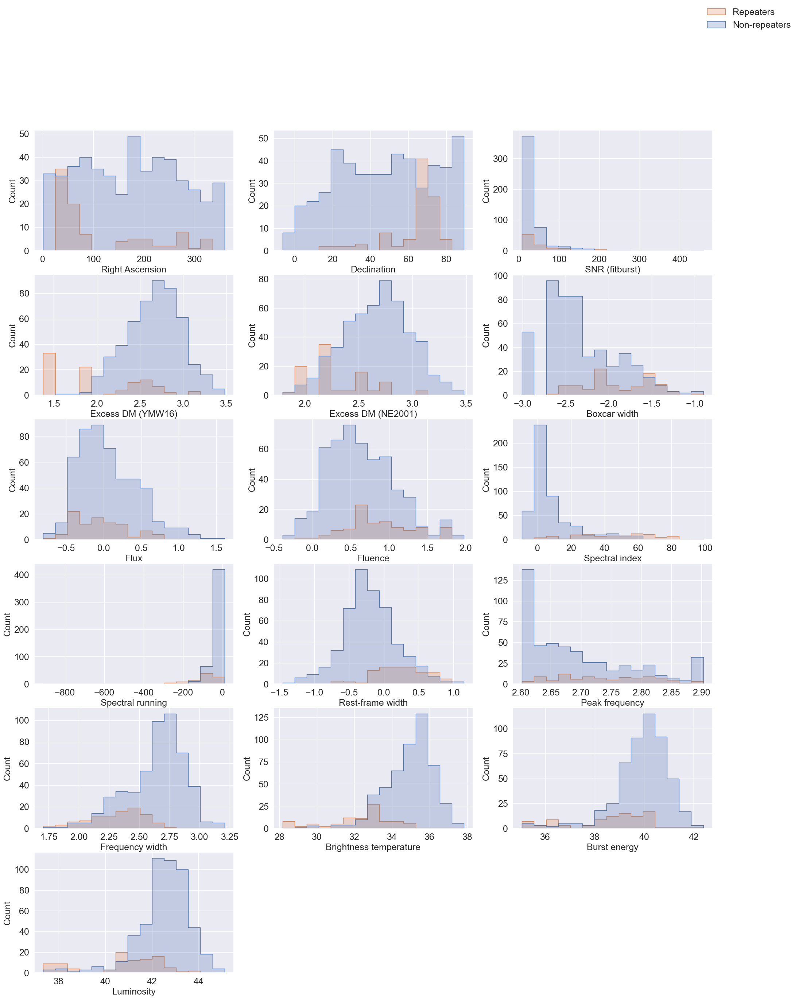

In [25]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.set_theme(style="darkgrid")
p = 24
figure = plt.figure(figsize=(p, 1.25 * p))
fs = 18
for i in range(len(FEATURES)):
    plt.subplot(int((len(FEATURES) - 1) / 3) + 1, 3, i + 1)
    print(FEATURES[i])
    sns.histplot(
        data=df,
        x=FEATURES[i],
        hue="is_repeater",
        bins=15,
        legend=False,
        element="step",
        kde=False,
    )
    plt.xlabel(FEATURE_LABELS[i], fontsize=fs)
    plt.ylabel("Count", fontsize=fs)
    plt.tick_params(labelsize=fs)
figure.legend(
    labels=["Repeaters", "Non-repeaters"], frameon=False, shadow=False, fontsize=fs
)
plt.savefig(
    f"./figures/preprocessing/{SELECTED_CATALOG}_parameters.png",
    bbox_inches="tight",
    dpi=100,
    pad_inches=0.1,
)
plt.show()

/Users/arjunsharma/Development/frb-2023-research/venv/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


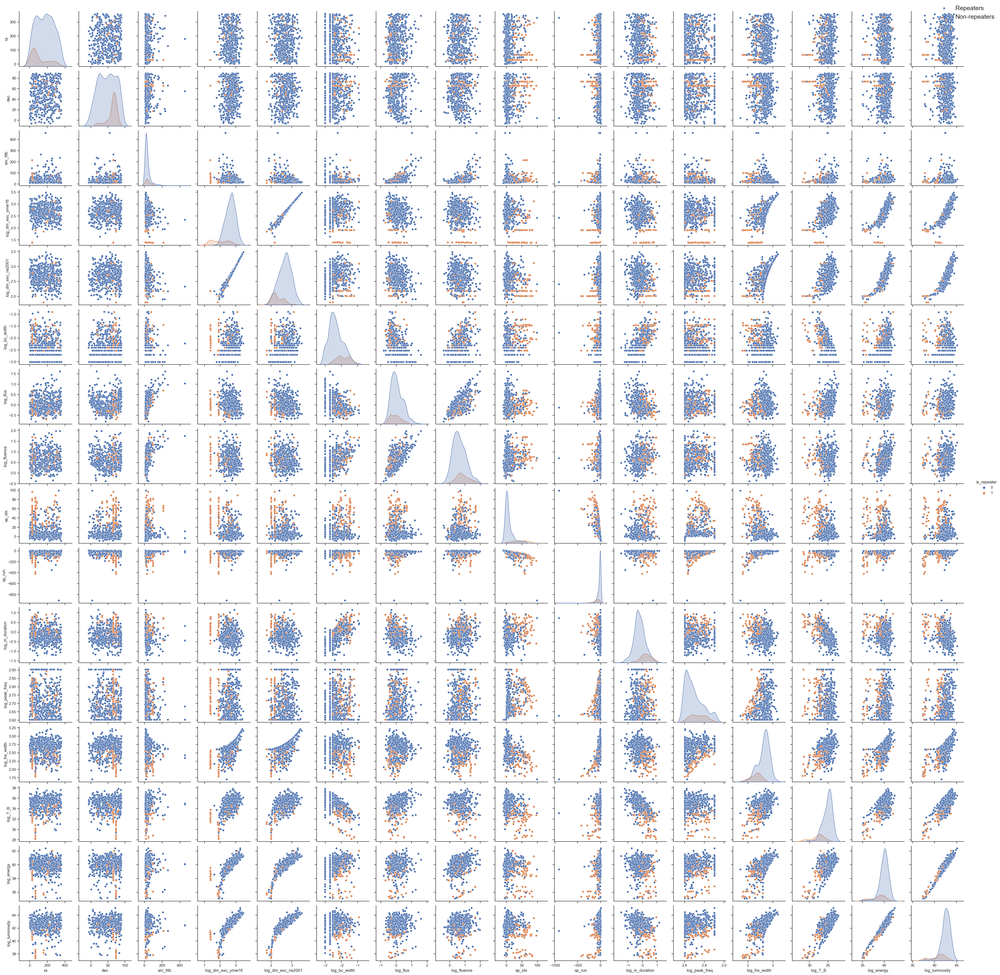

In [26]:
sns.set_theme(style="ticks")
pairplot = sns.pairplot(df, vars=FEATURES, hue="is_repeater")
pairplot.figure.legend(
    labels=["Repeaters", "Non-repeaters"], frameon=False, shadow=False, fontsize=fs
)
pairplot.savefig(f"figures/preprocessing/{SELECTED_CATALOG}_pairplot.png")

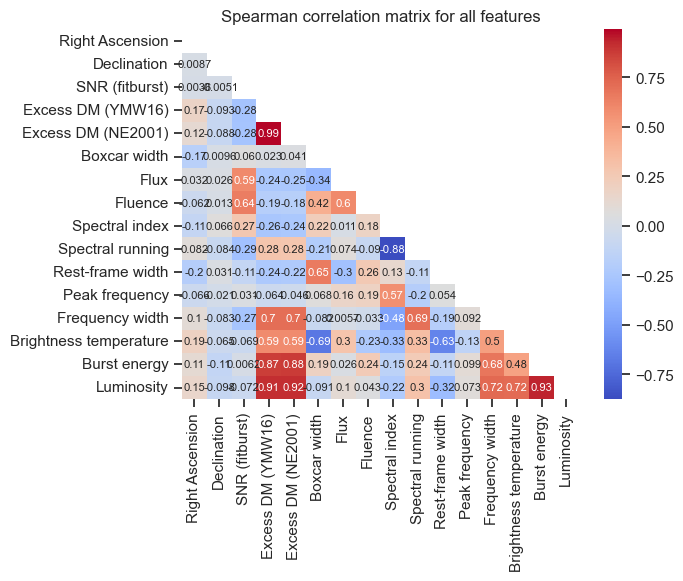

In [27]:
X = df[FEATURES]
corr_matrix = X.corr(method="spearman")
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
sns.heatmap(
    corr_matrix,
    xticklabels=FEATURE_LABELS,
    yticklabels=FEATURE_LABELS,
    annot=True,
    annot_kws={"size": 8},
    cmap="coolwarm",
    mask=mask,
)
plt.title("Spearman correlation matrix for all features")
plt.savefig(f"figures/preprocessing/{SELECTED_CATALOG}_correlation.png")
plt.show()

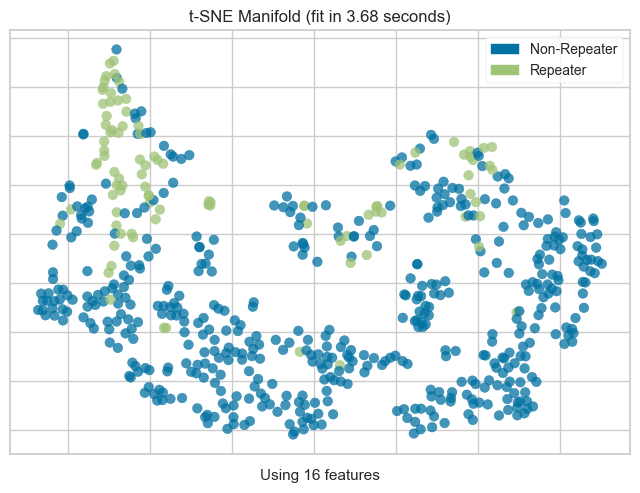

<Axes: title={'center': 't-SNE Manifold (fit in 3.68 seconds)'}, xlabel='Using 16 features'>

In [28]:
from yellowbrick.features import Manifold

classes = ["Non-Repeater", "Repeater"]
viz = Manifold(manifold="tsne", classes=classes)
viz.fit_transform(X, df["is_repeater"])
plt.title("t-SNE embedding of all features")
plt.savefig(f"figures/preprocessing/{SELECTED_CATALOG}_tsne.png")
viz.show()

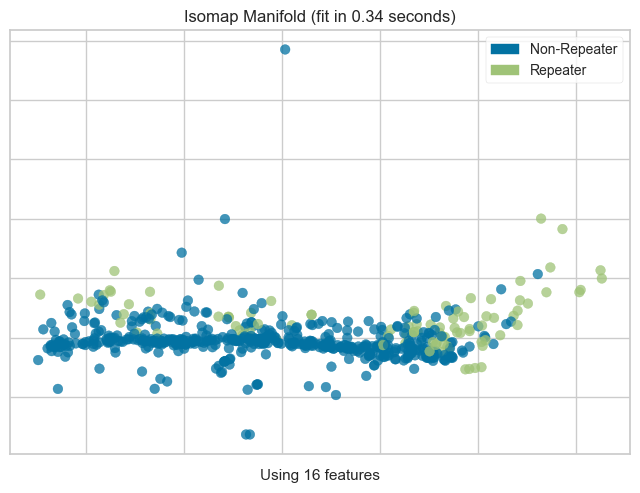

<Axes: title={'center': 'Isomap Manifold (fit in 0.34 seconds)'}, xlabel='Using 16 features'>

In [29]:
from sklearn.pipeline import Pipeline
from sklearn.feature_selection import f_classif, SelectKBest

viz = Manifold(manifold="isomap", n_neighbors=10, classes=classes)
viz.fit_transform(X, df["is_repeater"])
plt.title("Isomap embedding of the three most important features")
plt.savefig(f"figures/preprocessing/{SELECTED_CATALOG}_isomap.png")
viz.show()